## StanfordCars 图片下载&展示

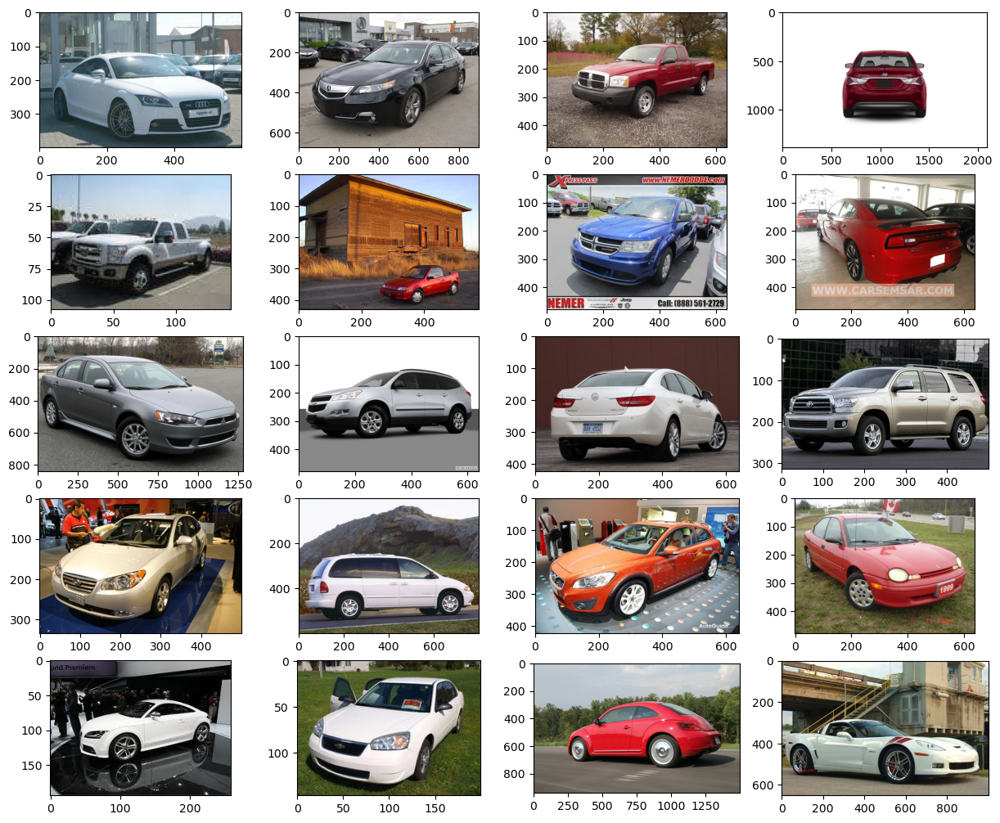

In [12]:
import torch
import torchvision
import matplotlib.pyplot as plt
device = "cuda:4" if torch.cuda.is_available() else "cpu"

def show_images(dataset, num_samples=20, cols=4):
    """ Plots some samples from the dataset """
    plt.figure(figsize=(15,15)) 
    for i, img in enumerate(data):
        if i == num_samples:
            break
        plt.subplot(int(num_samples/cols + 1), cols, i + 1) # 理解一下为什么要加 1
        plt.imshow(img[0])

data = torchvision.datasets.StanfordCars(root="./", download=False)
type(data)
show_images(data)

In [13]:
# list(enumerate(data))

In [14]:
#len(list(enumerate(data))) # 8144 张测试图片

## 搭建 Diffusion Model

### 1. 正向过程=噪声调度器
我们首先需要为我们的模型构建输入，这些输入是越来越多的噪声图像。我们可以使用论文中提供的封闭形式来单独计算任何时间步长的图像，而不是按顺序执行此操作。

**详情点**:
- 可以预先计算噪声水平/方差

- 有不同类型的方差表

- 我们可以对每个时间步长的图像进行独立采样（高斯之和也是高斯的）

- 在这个前进步骤中不需要模型

+ $\alpha_t = 1-\beta_t$
+ $\bar{\alpha}_{t}=\prod_{i=1}^{T} \alpha_{i}$
+ 前向扩散过程（重参数化技巧）：$\mathbf{x}_t = \sqrt{\bar{\alpha}_{t}} \mathbf{x}_{0}+\sqrt{1-\bar{\alpha}_{t}} \mathbf{z}$
+ 逆扩散过程：$q\left(x_{t-1} \mid x_{t}, x_{0}\right)=\mathcal{N}\left(x_{t-1} ; \tilde{\mu}\left(x_{t}, x_{0}\right), \tilde{\beta}_{t} \mathbf{I}\right)$
+ $x_{0}=\frac{1}{\sqrt{\bar{\alpha}_{t}}}\left(x_{t}-\sqrt{1-\bar{\alpha}_{t}} \mathbf{z}_{t}\right)$
+ 逆扩散过程中的方差：$\tilde{\beta}_{t}=\frac{1-\bar{\alpha}_{t-1}}{1-\bar{\alpha}_{t}} \cdot \beta_{t}$

In [15]:
import torch.nn.functional as F

def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """ 
    返回所传递的值列表vals中的特定索引，同时考虑到批处理维度。
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device=device):
    """ 
    接收一个图像和一个时间步长作为输入，并 返回它的噪声版本
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    #均值+方差
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# 界定测试时间表
T = 300
betas = linear_beta_schedule(timesteps=T)

# 预先计算闭合形式的不同项
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

### 2. 预处理数据集

In [16]:
from torchvision import transforms 
from torch.utils.data import DataLoader
import numpy as np

IMG_SIZE = 64
BATCH_SIZE = 256

# 数据转换
def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1] 
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1] 
    ]
    data_transform = transforms.Compose(data_transforms)

    train = torchvision.datasets.StanfordCars(root=".", download=False, 
                                         transform=data_transform)

    test = torchvision.datasets.StanfordCars(root=".", download=False, 
                                         transform=data_transform, split='test')
    return torch.utils.data.ConcatDataset([train, test])

#tensor转化成图像
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.cpu().numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :] 
    plt.imshow(reverse_transforms(image))

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

### 3. 模拟正向扩散过程

<class 'torch.Tensor'>


/tmp/ipykernel_161781/2152856731.py:16: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images+1, int(idx/stepsize) + 1) #plt.subplot(1行，11列，0/30 + 1)开始


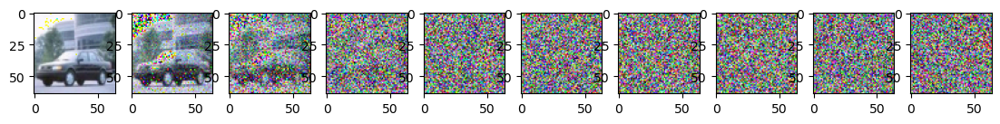

In [17]:
# 模拟正向扩散
image = next(iter(dataloader))[0]
print(type(image))

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

# T = 300 步
# step_size = 300 / 10 = 30
# 每隔 30 步显示一次加噪后的图像
for idx in range(0, T, stepsize):
#     print(idx)
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1) #plt.subplot(1行，11列，0/30 + 1)开始
    image, noise = forward_diffusion_sample(image, t)
    show_tensor_image(image)

### 4. 反向传播 = U-Net
U-Net教程: https://amaarora.github.io/2020/09/13/unet.html.


**详情点**:

+ 我们使用一种简单形式的 UNet 来预测图像中的噪声

+ 输入是噪声图像，输出图像中的噪声

+ 因为参数是跨时间共享的，所以我们需要告诉网络我们在哪个时间步长

+ Timestep 由变压器 Sinusoidal Embedding 编码

+ 我们输出一个单一的值（均值），因为方差是固定的

>time embedding的作用就是告诉U-Net现在reverse diffusion在第几步了,这和transformer中的位置编码一样，这正余弦编码或者是一个傅里叶特征。其给模型带来的提升也是明显的。但还有一个要加Time embeding的原因是因为，U-net是参数共享的，加入time embedding能够根据不同的输入而生成不同的输出。 我们希望在reverse diffusion的过程中，U-net能先生成一些大概的轮廓，很粗糙的coarse的图像，不需要很清晰。随着reverse diffusion往前走，当在接近还原为原来的图像的时候，我们希望能够学习到物体的边边角角的信息，一些高频信息，这样才能使输出的图片更加逼真。

In [18]:
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()
        
    def forward(self, x, t, ):
        # 第一次卷积
        h = self.bnorm1(self.relu(self.conv1(x)))
        # 时间嵌入
        time_emb = self.relu(self.time_mlp(t))
        # 扩展到最后2个维度
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # 添加时间通道
        h = h + time_emb
        # 第二次卷积
        h = self.bnorm2(self.relu(self.conv2(h)))
        # 上采样或者下采样
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


class SimpleUnet(nn.Module):
    """
    Unet架构的一个简化版本
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 1 
        time_emb_dim = 32

        # 时间嵌入
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )
        
        # 初始预估
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # 下采样
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # 上采样
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        self.output = nn.Conv2d(up_channels[-1], 3, out_dim)

    def forward(self, x, timestep):
        # 时间嵌入
        t = self.time_mlp(timestep)
        # 初始卷积
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # 添加残差结构作为额外的通道
            x = torch.cat((x, residual_x), dim=1)           
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor

### 5. 损失函数

In [19]:
# 损失函数求什么损失？实际的噪声与预测的噪声的 loss
# 那么就需要先在前向过程加噪得到加噪图像
# 再经过我们的 model 预测出噪声
# 再与前向过程的噪声做 loss
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

### 6. 采样
- 如果不加入@torch.no_grad()，我们很快就会耗尽内存，因为pytorch会把之前所有的图像都打包用于梯度计算
 
- 因为我们预先计算了前向通道的噪声方差，所以当我们依次执行后向过程时也必须使用这些方差

In [20]:
@torch.no_grad()#防止内存爆炸
def sample_timestep(x, t):
    """
    调用模型来预测图像中的噪声，并返回 
    去噪后的图像。
    如果我们还没有进入最后一步，则对该图像施加噪声。
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # 调用模型（当前图像--噪声预测）。
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

@torch.no_grad()
def sample_plot_image():
    # 样本噪声
    img_size = IMG_SIZE
    # 随机采样一个高斯噪声 img
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images) ## 300 / 10 = 30，采样过程还是每隔 30 步显示一次去噪的图像

#     for i in range(0,T)[::-1]:
    for i in range(0,T):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t) # 一步步得出去噪的图像
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize+1))
            show_tensor_image(img.detach().cpu())
    plt.show()            

### 7. 训练

epoch loop:   0%|          | 0/100 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 0.8109563589096069 


/tmp/ipykernel_161781/3178331066.py:42: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize+1))


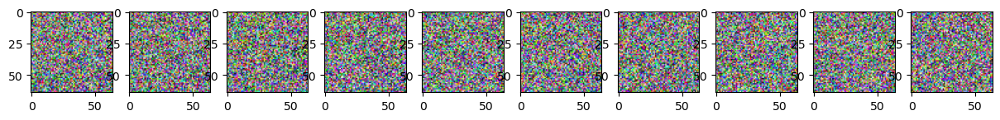

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 5 | step 000 Loss: 0.17191192507743835 


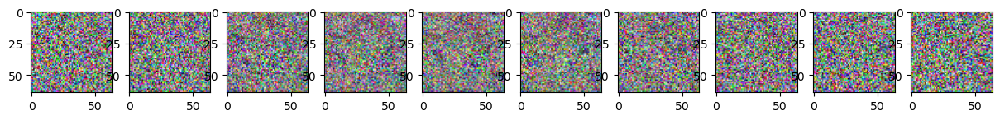

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 10 | step 000 Loss: 0.17062923312187195 


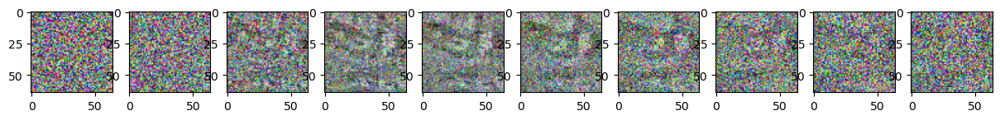

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 15 | step 000 Loss: 0.16099762916564941 


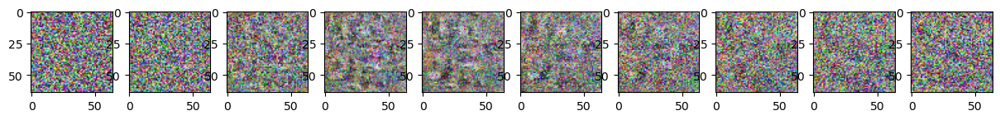

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 20 | step 000 Loss: 0.1608249545097351 


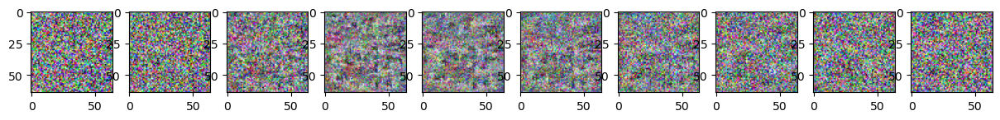

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 25 | step 000 Loss: 0.16324153542518616 


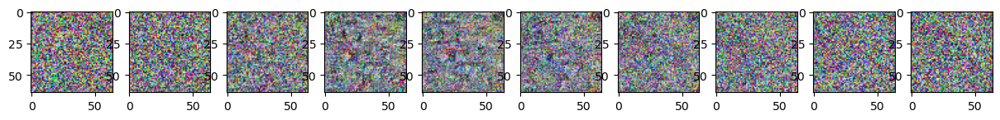

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 30 | step 000 Loss: 0.14913086593151093 


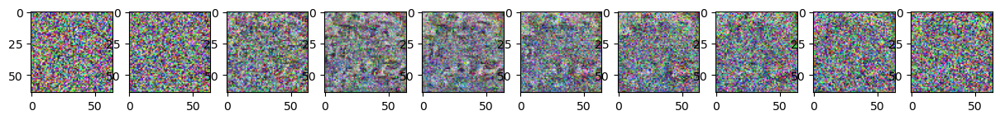

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 35 | step 000 Loss: 0.15136228501796722 


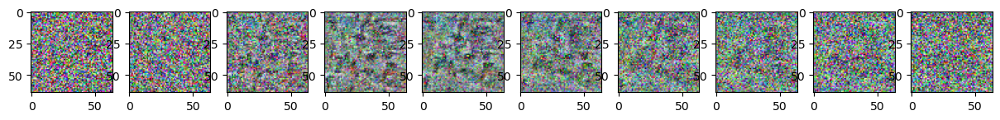

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 40 | step 000 Loss: 0.14841130375862122 


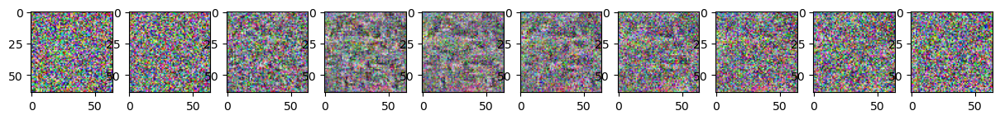

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 45 | step 000 Loss: 0.1532546579837799 


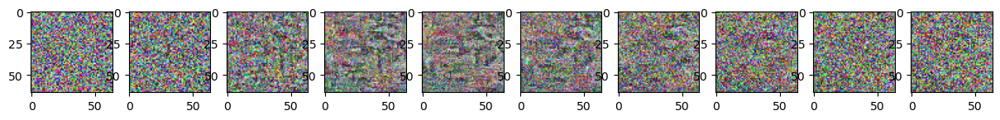

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 50 | step 000 Loss: 0.1556406021118164 


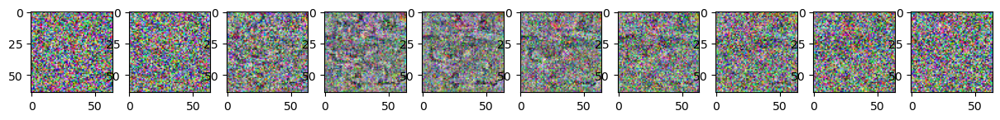

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 55 | step 000 Loss: 0.14472083747386932 


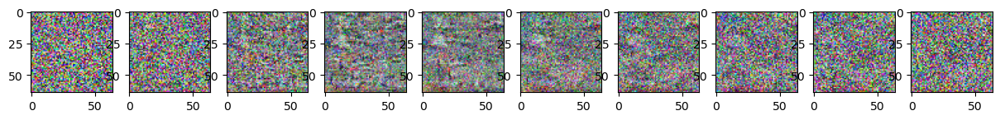

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 60 | step 000 Loss: 0.13877296447753906 


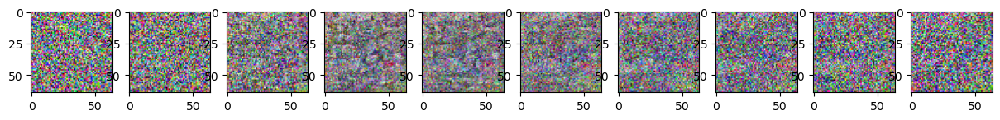

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 65 | step 000 Loss: 0.14688193798065186 


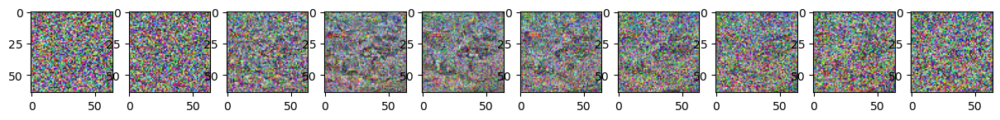

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 70 | step 000 Loss: 0.13928942382335663 


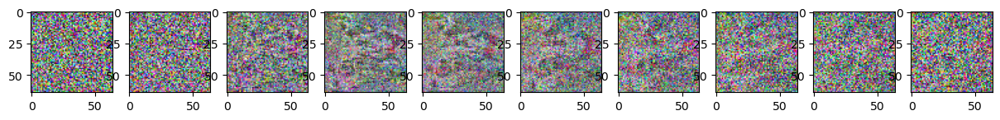

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 75 | step 000 Loss: 0.1372877061367035 


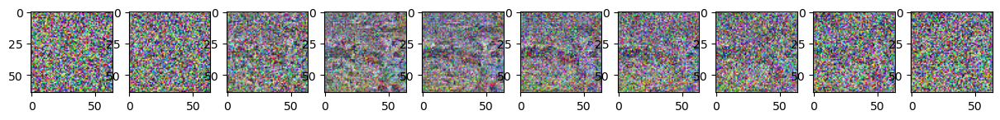

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 80 | step 000 Loss: 0.13768641650676727 


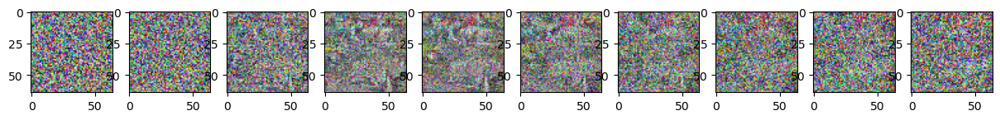

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 85 | step 000 Loss: 0.14988172054290771 


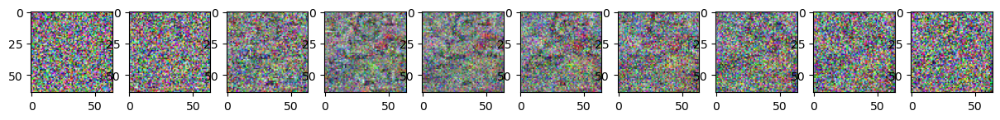

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 90 | step 000 Loss: 0.14651671051979065 


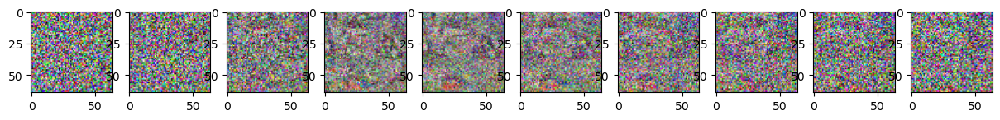

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 95 | step 000 Loss: 0.14043082296848297 


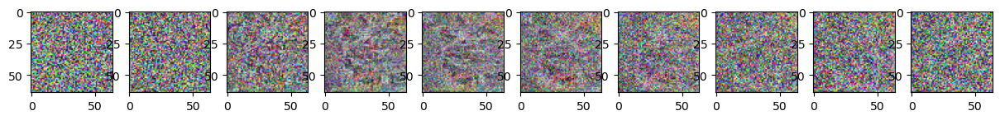

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

batch loop:   0%|          | 0/63 [00:00<?, ?it/s]

In [21]:
from tqdm.autonotebook import tqdm
from tqdm.contrib import tenumerate, tzip, tmap
from tqdm.auto import trange

from torch.optim import Adam

device = "cuda:4" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 100 # Try more!
# debug
# epochs = 3 # debug

for epoch in trange(epochs, desc='epoch loop'):
    for step, batch in tenumerate(dataloader, desc='batch loop', leave=False):
        optimizer.zero_grad()
        
        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
        loss = get_loss(model, batch[0], t)
        loss.backward()
        optimizer.step()
        
#         print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
#         sample_plot_image()
        
#         print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        
        if epoch % 5 ==0 and step == 0:
            print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
            sample_plot_image()